In [1]:
# Import modules, load the model, load the data 

output_dir = ['/staging/leuven/stg_00002/lcb/nkemp/fca/v1/basset']
selected_model = ['model_epoch_15.hdf5'] # or 38

import sys  
import os
import pickle
import utils
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
from tensorflow.python.keras.backend import set_session
#sys.path.insert(0, output_dir)
import numpy as np
import tensorflow as tf
from tensorflow.python.keras.backend import set_session
tf.compat.v1.disable_v2_behavior()
tf.compat.v1.disable_eager_execution()

config = tf.compat.v1.ConfigProto(intra_op_parallelism_threads=8, 
                        inter_op_parallelism_threads=8, 
                        allow_soft_placement=True,
                        device_count = {'CPU': 8})
session = tf.compat.v1.Session(config=config)
set_session(session)

matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

print('Loading models...')
models = []
for i in range(len(selected_model)):
    models.append(utils.load_model(output_dir[i], selected_model[i]))

print('Loading data...')
f = open(os.path.join('/staging/leuven/stg_00002/lcb/nkemp/fca/v1/', 'nonAugmented_data_dict.pkl'), "rb")
nonAugmented_data_dict = pickle.load(f)
f.close()

2022-06-24 09:33:12.510138: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.11.0
/staging/leuven/stg_00002/lcb/nkemp/software/anaconda3/envs/deeplearning_py38_tf241/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Instructions for updating:
non-resource variables are not supported in the long term
Loading models...


2022-06-24 09:34:16.728608: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-06-24 09:34:16.766993: I tensorflow/compiler/jit/xla_gpu_device.cc:99] Not creating XLA devices, tf_xla_enable_xla_devices not set
2022-06-24 09:34:16.802568: W tensorflow/stream_executor/platform/default/dso_loader.cc:60] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory
2022-06-24 09:34:16.802637: W tensorflow/stream_executor/cuda/cuda_driver.cc:326] failed call to cuInit: UNKNOWN ERROR (303)
2022-06-24 09:34:16.803255: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (r23i27n24): /proc/driver

Loading data...


In [4]:
models[0].summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 500, 4)]          0         
_________________________________________________________________
conv1d_10 (Conv1D)           (None, 500, 300)          22800     
_________________________________________________________________
batch_normalization (BatchNo (None, 500, 300)          1200      
_________________________________________________________________
activation_1 (Activation)    (None, 500, 300)          0         
_________________________________________________________________
dropout_3 (Dropout)          (None, 500, 300)          0         
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 166, 300)          0         
_________________________________________________________________
conv1d_11 (Conv1D)           (None, 156, 200)          660000

Average auROC*auPR: 0.17709655062785254


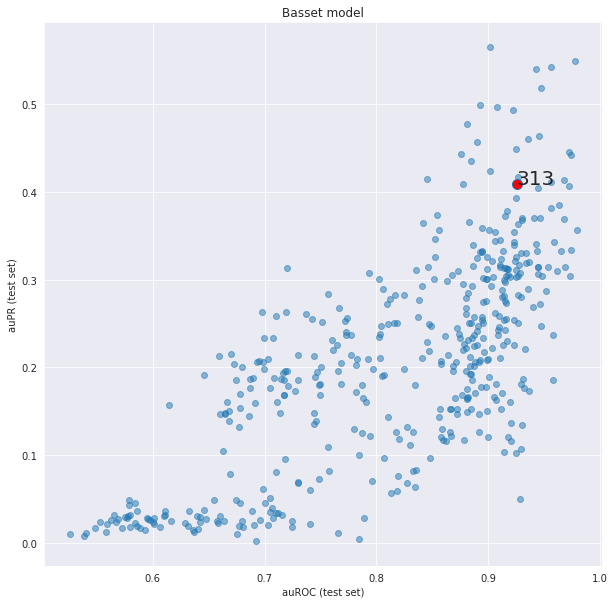

In [6]:
# ROC_PR scatter plot, shows performance of the model on each topic
import seaborn as sns
sns.set_style("darkgrid")

for outdir in output_dir:
    number_of_classes = models[0].output_shape[1]
    roc_pr_dict = np.load(os.path.join(outdir, 'roc_pr.npz'),allow_pickle=True)['roc_pr'].item()
    
    dataset = 'test'  
    # If you want to print the auROC and auPR for a selected topic
    #topic = 430
    #print(roc_pr_dict[dataset]["roc_pr"][topic-1,0])
    #print(roc_pr_dict[dataset]["roc_pr"][topic-1,1])

    fig = plt.figure(figsize=(10,10))
    ax = fig.add_subplot(1,1,1)
    ax.scatter(roc_pr_dict[dataset]["roc_pr"][:,0],roc_pr_dict[dataset]["roc_pr"][:,1], alpha=0.5)
    plt.xlabel("auROC (" + dataset + " set)")
    plt.ylabel("auPR (" + dataset + " set)")
    plt.title('Basset model')
    txt = list(range(1,number_of_classes+1))
    for i, n in enumerate(txt):
        #if(n == 313 or n == 253 or n == 20):
        if(n == 313):
            ax.annotate(str(n), (roc_pr_dict[dataset]["roc_pr"][:,0][i], roc_pr_dict[dataset]["roc_pr"][:,1][i]), fontsize=20)
            ax.plot(roc_pr_dict[dataset]["roc_pr"][:,0][i], roc_pr_dict[dataset]["roc_pr"][:,1][i], marker="o", markersize=10, markerfacecolor="red")
    avg_1 = np.mean(roc_pr_dict[dataset]["roc_pr"][:,0] * roc_pr_dict[dataset]["roc_pr"][:,1])

    print('Average auROC*auPR: ' + str(avg_1))

In [29]:
# Multiple model loading and initialising DeepExplainer 

import shap
# select 500 random samples for DeepExplainer to use as background reference data
rn=np.random.choice(nonAugmented_data_dict["valid_data"].shape[0], 500, replace=False)
model_dict = {}
exp_dict = {} 

for i in range(len(models)):
    name = str(i)
    model_dict[name] = models[i]
    # We select the second to last layer as output to avoid saturation effects from the final activation layer
    exp_dict[name] = shap.DeepExplainer((model_dict[name].inputs, model_dict[name].layers[-2].output), nonAugmented_data_dict["valid_data"][rn])

Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode. See PR #1483 for discussion.


# DeepExplainer plots

(Swann message)
Here you have the list of annotation related to each Topic, quickly looking through them I spot :
- muscle cell* = Topic 22, 189, 199, 200, 295
- follicle cell = Topic 42, 248
- indirect flight muscle* = Topic 61, 97, 301
- tracheal cell = Topic 69, 183
- epithelial cell* = Topic 83, 160, 233, 321, 421
- fat body = Topic 145, 349, 412
- hemocyte* = Topic 282
- oenocyte = Topic 367
- salivary gland* = Topic 430

Annotations with * are the one where I expect easy motifs to be found (muscle = mef2, epitehlial = grh, hemocyte = pnr, salivary gland = fkh)

DAR topics:
- Cluster 16 / 17 / 52 / 24 -> muscle
- Cluster 0 / 1 / 11 -> indirect flight muscle
- Cluster 2 / 15 / 4 / 26 / 20 / 32 / 2 / 28 -> fat body
- Cluster 72 -> salivary gland
- Cluster 56 / 59 -> ensheating glia and glia
- Cluster 39 / 18 / 35 / 21 / 53 -> some epithelial stuffs
- Cluster 9 / 25 / 27 -> central brain

  0%|                                                    | 0/10 [00:00<?, ?it/s]

Sequence: ('chr2L', 4020174, 4020674)
[[[0 0 0 1]
  [0 1 0 0]
  [0 0 0 1]
  ...
  [0 0 0 1]
  [0 0 1 0]
  [0 1 0 0]]]

Topic 253
Model 1
0.0006375015


<Figure size 3600x1440 with 0 Axes>

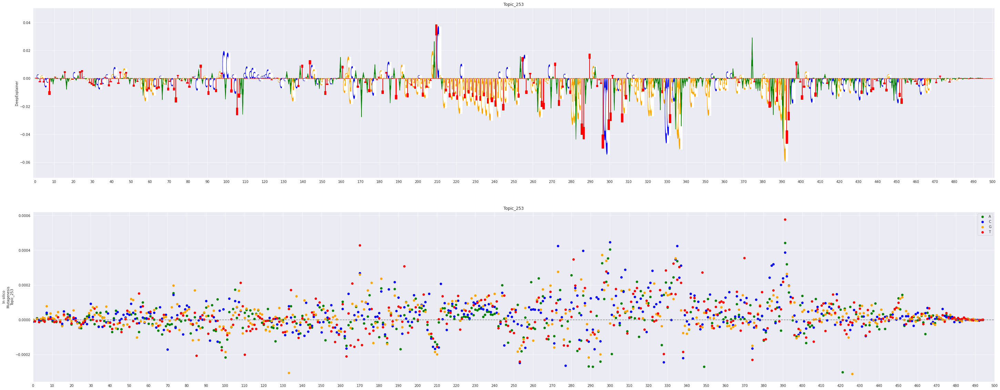

 10%|████▍                                       | 1/10 [00:28<04:15, 28.34s/it]

Sequence: ('chr2L', 7221602, 7222102)
[[[0 0 1 0]
  [1 0 0 0]
  [0 0 0 1]
  ...
  [1 0 0 0]
  [0 0 1 0]
  [0 0 0 1]]]

Topic 253
Model 1
0.00027555227


<Figure size 3600x1440 with 0 Axes>

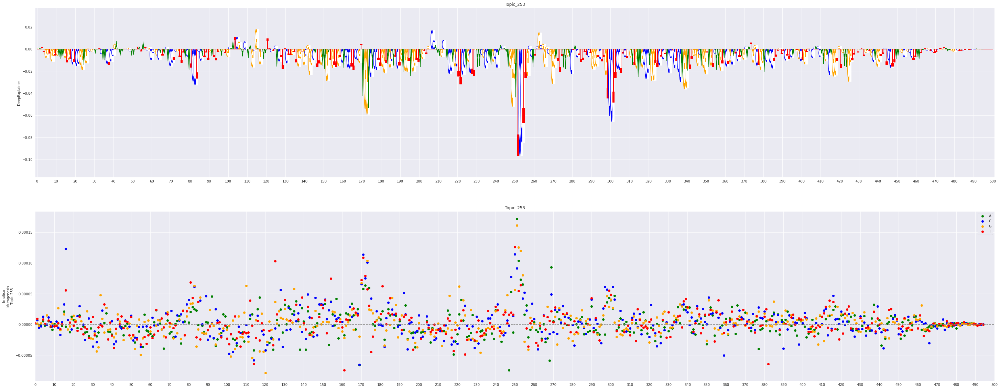

 20%|████████▊                                   | 2/10 [00:53<03:33, 26.73s/it]

Sequence: ('chr2L', 7412902, 7413402)
[[[1 0 0 0]
  [0 0 1 0]
  [1 0 0 0]
  ...
  [0 1 0 0]
  [1 0 0 0]
  [1 0 0 0]]]

Topic 253
Model 1
0.028884381


<Figure size 3600x1440 with 0 Axes>

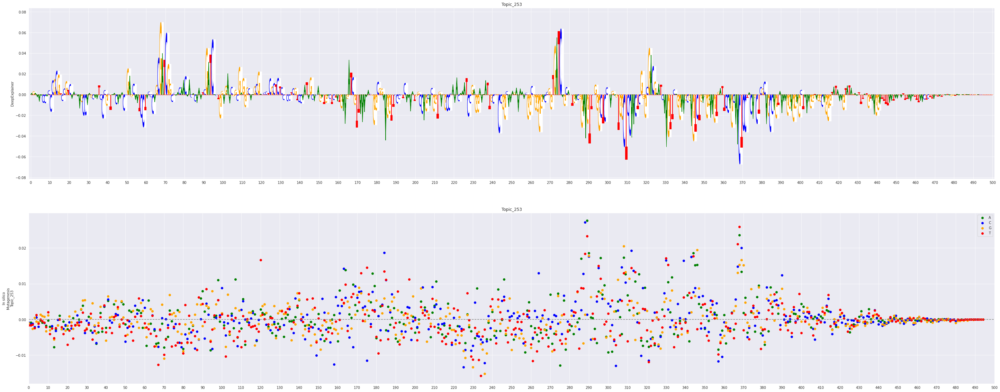

 30%|█████████████▏                              | 3/10 [01:21<03:09, 27.04s/it]

Sequence: ('chr2L', 15112437, 15112937)
[[[1 0 0 0]
  [0 0 0 1]
  [0 0 1 0]
  ...
  [0 1 0 0]
  [0 0 1 0]
  [0 0 1 0]]]

Topic 253
Model 1
0.00068569183


<Figure size 3600x1440 with 0 Axes>

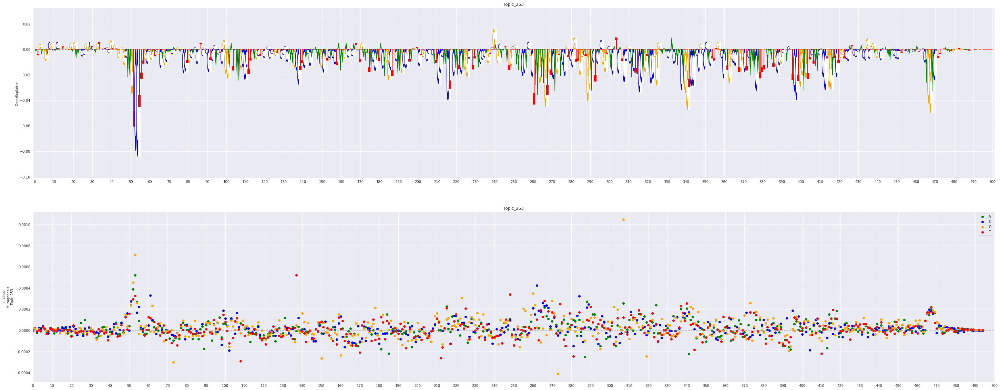

 40%|█████████████████▌                          | 4/10 [01:49<02:44, 27.46s/it]

Sequence: ('chr2L', 15254917, 15255417)
[[[0 0 1 0]
  [0 1 0 0]
  [0 0 0 1]
  ...
  [0 1 0 0]
  [0 0 0 1]
  [0 0 0 1]]]

Topic 253
Model 1
0.0010391474


<Figure size 3600x1440 with 0 Axes>

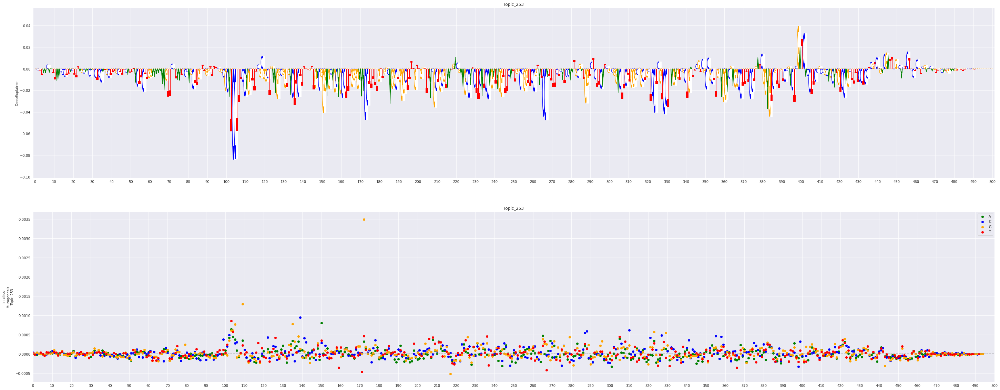

 50%|██████████████████████                      | 5/10 [02:17<02:18, 27.79s/it]

Sequence: ('chr2L', 15497991, 15498491)
[[[1 0 0 0]
  [0 0 1 0]
  [0 0 1 0]
  ...
  [0 1 0 0]
  [0 0 0 1]
  [1 0 0 0]]]

Topic 253
Model 1
0.010301888


<Figure size 3600x1440 with 0 Axes>

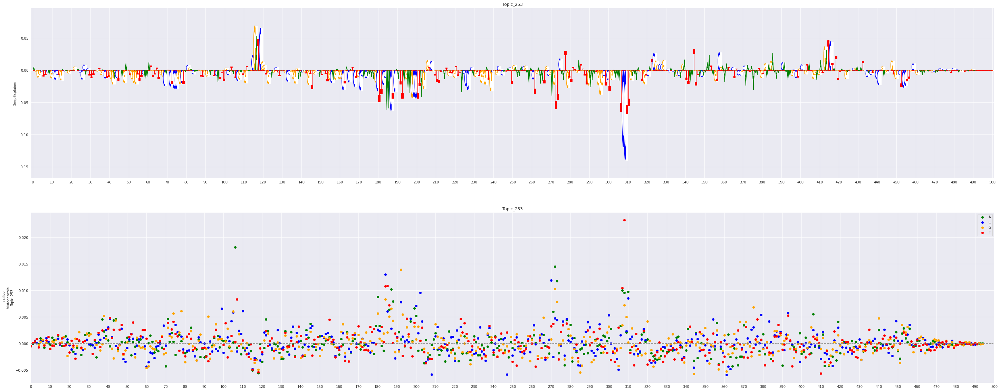

 60%|██████████████████████████▍                 | 6/10 [02:46<01:52, 28.00s/it]

Sequence: ('chr2L', 7783529, 7784029)
[[[1 0 0 0]
  [0 0 1 0]
  [1 0 0 0]
  ...
  [0 0 0 1]
  [0 0 0 1]
  [1 0 0 0]]]

Topic 253
Model 1
0.023718089


<Figure size 3600x1440 with 0 Axes>

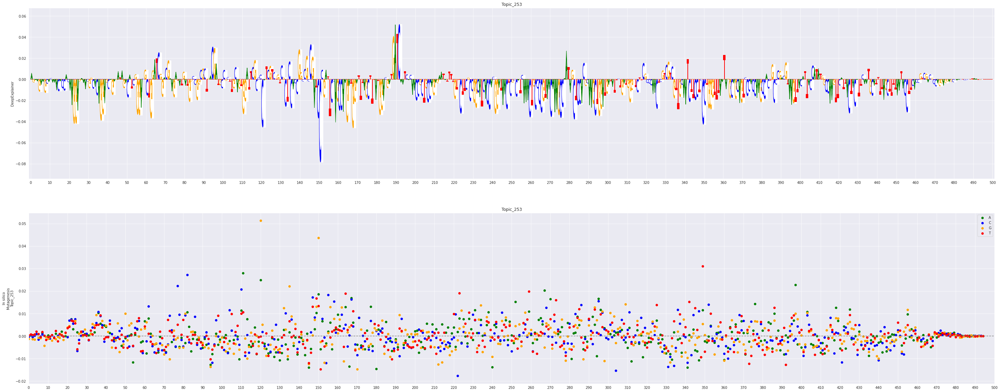

 70%|██████████████████████████████▊             | 7/10 [03:14<01:24, 28.00s/it]

Sequence: ('chr2L', 3468871, 3469371)
[[[1 0 0 0]
  [0 0 0 1]
  [0 0 1 0]
  ...
  [1 0 0 0]
  [0 0 1 0]
  [0 1 0 0]]]

Topic 253
Model 1
0.0003733039


<Figure size 3600x1440 with 0 Axes>

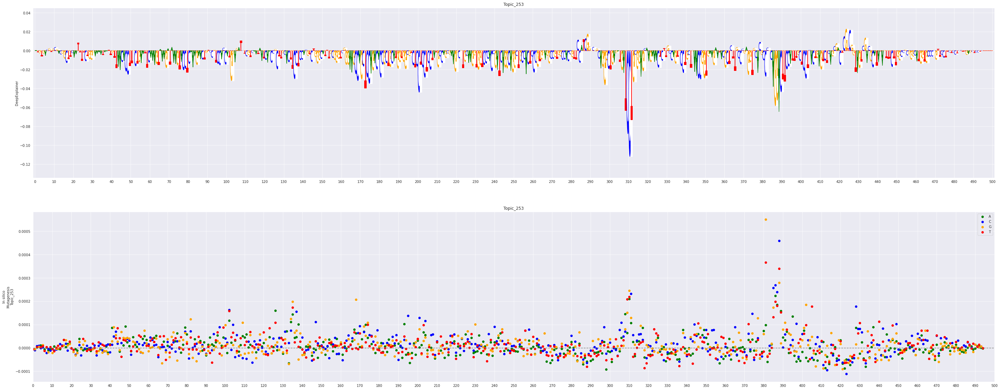

 80%|███████████████████████████████████▏        | 8/10 [03:42<00:55, 27.93s/it]

Sequence: ('chr2L', 3355698, 3356198)
[[[0 0 1 0]
  [0 0 0 1]
  [0 0 0 1]
  ...
  [0 0 1 0]
  [0 0 1 0]
  [1 0 0 0]]]

Topic 253
Model 1
0.008946657


<Figure size 3600x1440 with 0 Axes>

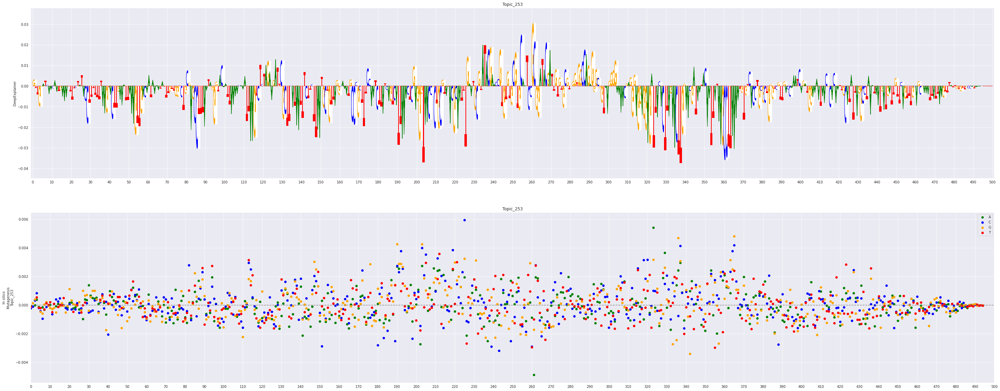

 90%|███████████████████████████████████████▌    | 9/10 [04:10<00:28, 28.07s/it]

Sequence: ('chr2L', 3873270, 3873770)
[[[1 0 0 0]
  [0 0 0 1]
  [0 0 1 0]
  ...
  [0 0 0 1]
  [0 1 0 0]
  [0 1 0 0]]]

Topic 253
Model 1
0.00092062354


<Figure size 3600x1440 with 0 Axes>

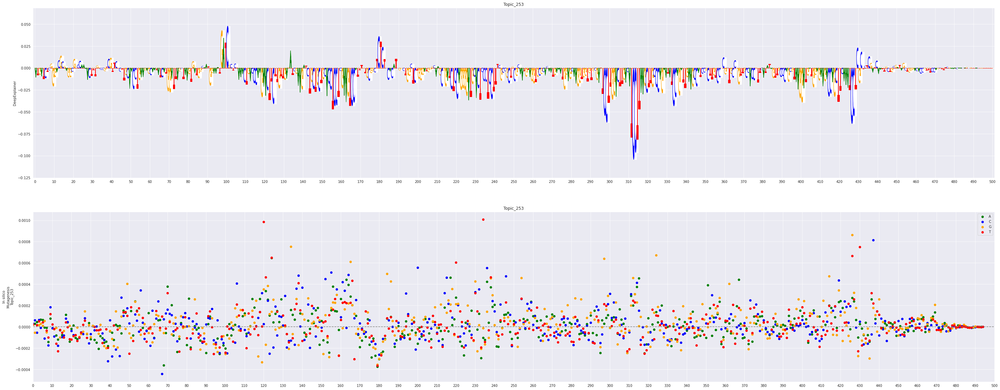

  0%|                                                    | 0/10 [00:00<?, ?it/s]

Sequence: ('chr2L', 6812225, 6812725)
[[[0 0 0 1]
  [0 0 0 1]
  [1 0 0 0]
  ...
  [1 0 0 0]
  [1 0 0 0]
  [0 0 0 1]]]

Topic 313
Model 1
0.0805583


<Figure size 3600x1440 with 0 Axes>

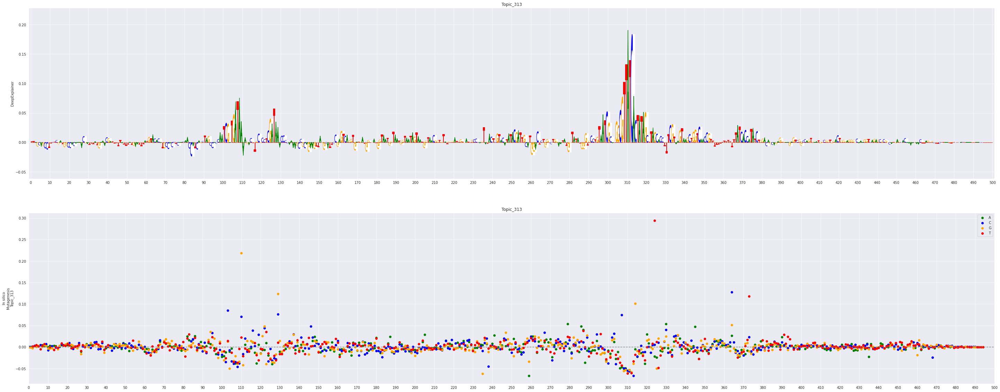

 10%|████▍                                       | 1/10 [00:28<04:18, 28.68s/it]

Sequence: ('chr2L', 3561004, 3561504)
[[[0 0 0 1]
  [1 0 0 0]
  [1 0 0 0]
  ...
  [1 0 0 0]
  [0 0 0 1]
  [0 0 1 0]]]

Topic 313
Model 1
0.10737297


<Figure size 3600x1440 with 0 Axes>

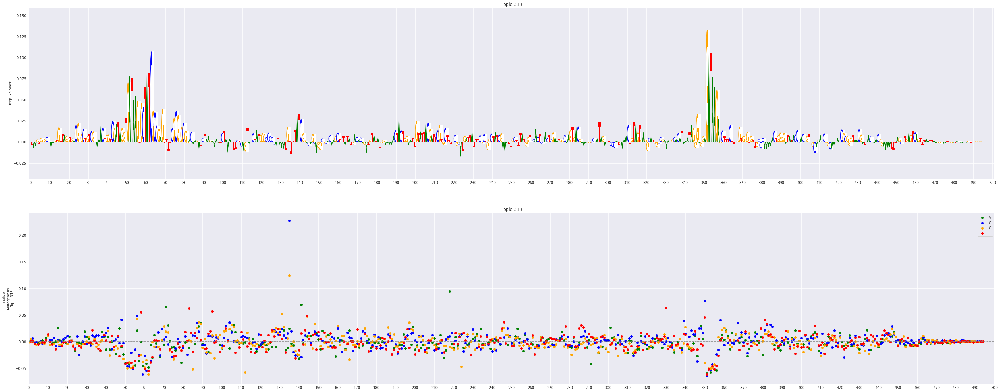

 20%|████████▊                                   | 2/10 [00:56<03:47, 28.45s/it]

Sequence: ('chr3R', 13303785, 13304285)
[[[0 1 0 0]
  [0 0 0 1]
  [0 0 0 1]
  ...
  [0 0 0 1]
  [0 0 1 0]
  [0 1 0 0]]]

Topic 313
Model 1
0.32067537


<Figure size 3600x1440 with 0 Axes>

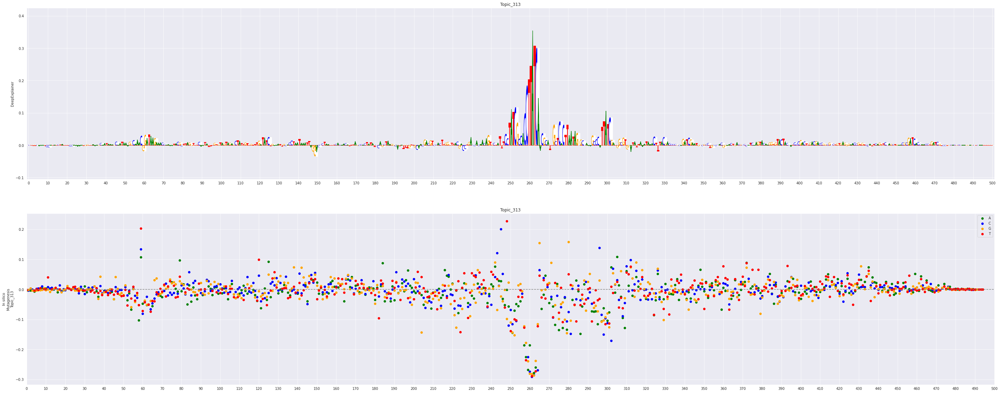

 30%|█████████████▏                              | 3/10 [01:22<03:10, 27.23s/it]

Sequence: ('chr2R', 14678233, 14678733)
[[[1 0 0 0]
  [0 0 0 1]
  [1 0 0 0]
  ...
  [1 0 0 0]
  [0 0 0 1]
  [1 0 0 0]]]

Topic 313
Model 1
0.036804467


<Figure size 3600x1440 with 0 Axes>

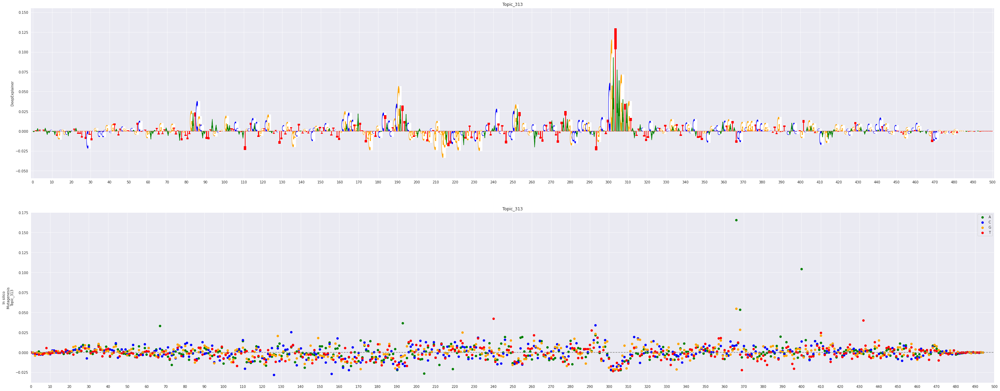

 40%|█████████████████▌                          | 4/10 [01:51<02:46, 27.72s/it]

Sequence: ('chr3L', 2813723, 2814223)
[[[0 1 0 0]
  [0 0 0 1]
  [1 0 0 0]
  ...
  [0 0 0 1]
  [0 0 0 1]
  [0 0 1 0]]]

Topic 313
Model 1
0.013470501


<Figure size 3600x1440 with 0 Axes>

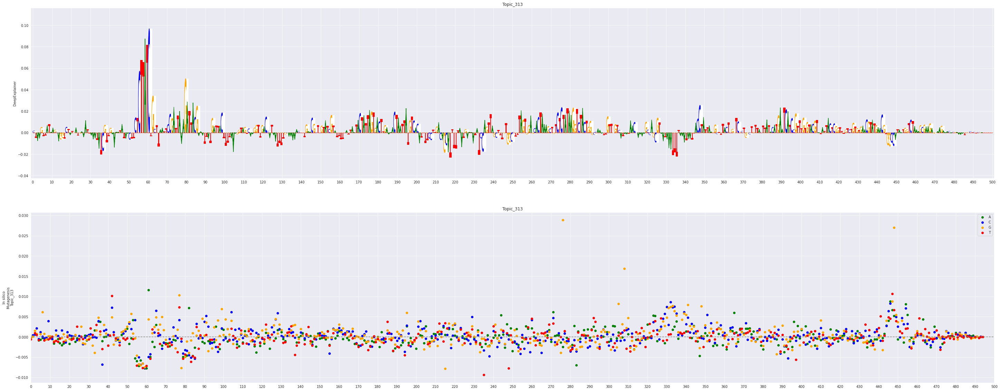

 50%|██████████████████████                      | 5/10 [02:19<02:19, 27.94s/it]

Sequence: ('chr2L', 8351804, 8352304)
[[[1 0 0 0]
  [1 0 0 0]
  [0 0 0 1]
  ...
  [0 0 1 0]
  [0 0 1 0]
  [1 0 0 0]]]

Topic 313
Model 1
0.21059906


<Figure size 3600x1440 with 0 Axes>

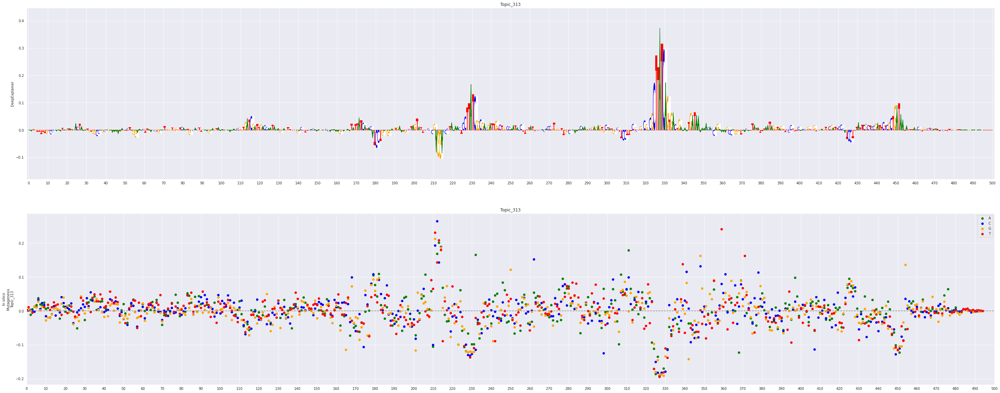

 60%|██████████████████████████▍                 | 6/10 [02:47<01:51, 27.83s/it]

Sequence: ('chr2L', 9010193, 9010693)
[[[1 0 0 0]
  [0 0 0 1]
  [0 1 0 0]
  ...
  [0 0 0 1]
  [0 0 0 1]
  [0 0 1 0]]]

Topic 313
Model 1
0.12708998


<Figure size 3600x1440 with 0 Axes>

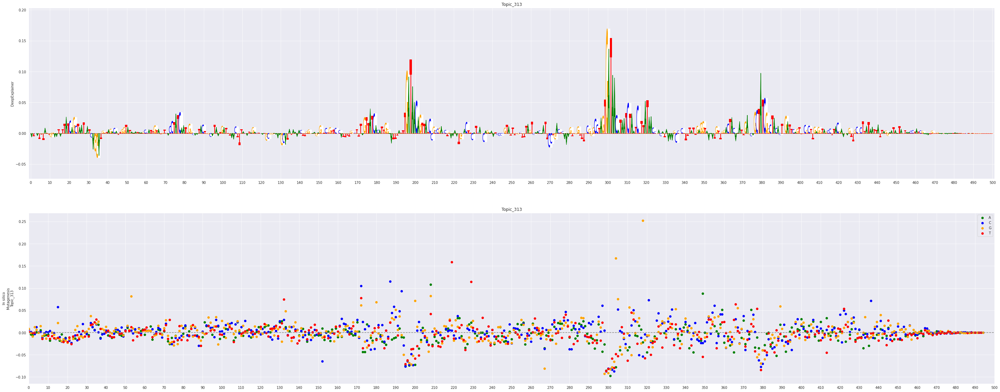

 70%|██████████████████████████████▊             | 7/10 [03:15<01:23, 27.90s/it]

Sequence: ('chr2L', 14014922, 14015422)
[[[0 0 0 1]
  [0 0 1 0]
  [0 1 0 0]
  ...
  [1 0 0 0]
  [1 0 0 0]
  [0 0 0 1]]]

Topic 313
Model 1
0.4045682


<Figure size 3600x1440 with 0 Axes>

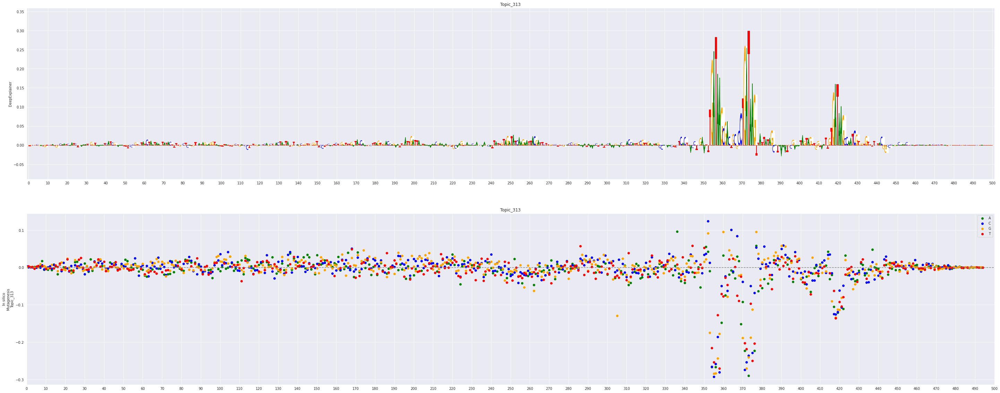

 80%|███████████████████████████████████▏        | 8/10 [03:44<00:56, 28.19s/it]

Sequence: ('chr2L', 6819052, 6819552)
[[[0 1 0 0]
  [0 0 0 1]
  [0 1 0 0]
  ...
  [0 0 0 1]
  [0 0 1 0]
  [1 0 0 0]]]

Topic 313
Model 1
0.017573446


<Figure size 3600x1440 with 0 Axes>

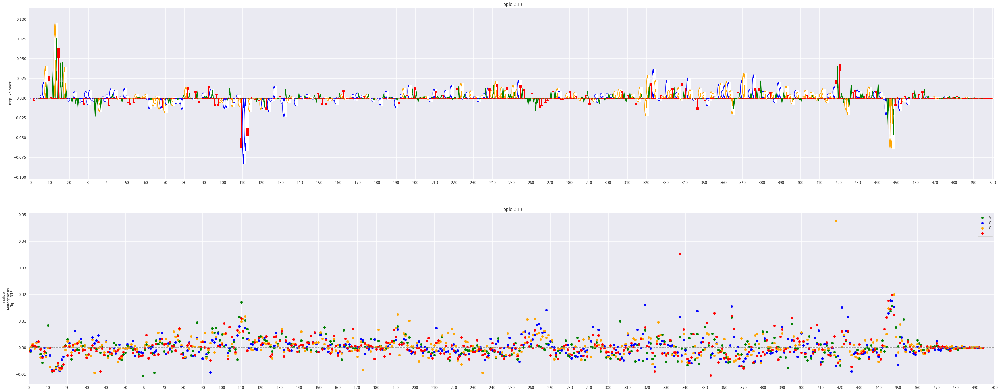

 90%|███████████████████████████████████████▌    | 9/10 [04:09<00:27, 27.45s/it]

Sequence: ('chr2R', 17337990, 17338490)
[[[0 1 0 0]
  [0 0 0 1]
  [0 0 1 0]
  ...
  [0 0 1 0]
  [0 1 0 0]
  [0 1 0 0]]]

Topic 313
Model 1
0.04286927


<Figure size 3600x1440 with 0 Axes>

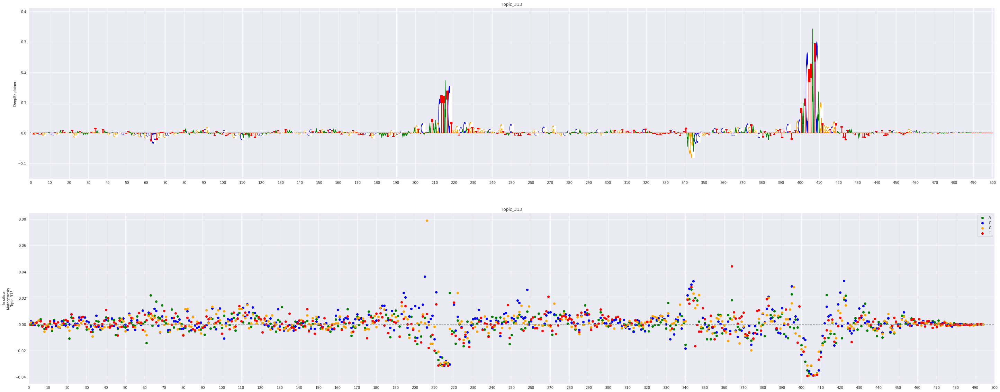

100%|███████████████████████████████████████████| 10/10 [04:38<00:00, 27.81s/it]


In [37]:
# Plot deepexplainers from a given BED file

from pybedtools import BedTool
from tqdm import tqdm 
genomefile_path = "/staging/leuven/stg_00002/lcb/itask/files/genomes/dm6/dmel-all-chromosome-r6.03.fasta"

topics_list = [253, 313]


# Select BED file
filenames = ['/data/leuven/338/vsc33893/jupyterhub_notebooks/thesis/dl/muscle_regions.bed', 
             '/data/leuven/338/vsc33893/jupyterhub_notebooks/thesis/dl/epithelium_regions.bed']
for i in range(0,2):
    topics = [topics_list[i]]
    filename = filenames[i]
    n_plots = 10
    with open(filename) as inp:
            lines = inp.readlines()                
            lines = [line.strip().split() for line in lines]
    
    # You can select multiple topics to be checked for a given sequence
    for i in tqdm(range((n_plots))):
        z = 0 # offset
        location = ("chr"+lines[i+z][0],int(lines[i+z][1]),int(lines[i+z][2])) 
        print("Sequence: " + str(location))
        seq_onehot = utils.one_hot_encode_along_row_axis(BedTool.seq(location, genomefile_path))
        print(seq_onehot)
        
        ntrack = (len(models))*2
        fig = plt.figure(figsize=(50,ntrack*10))
        for topic in topics:
            print('\nTopic '+str(topic))
            fig = plt.figure(figsize=(50,ntrack*10))
            for j in range(0,len(models)):
                print('Model ' + str(j+1))
                # We print the prediction score the model gives the selected sequence for the given topic
                arr = models[j].predict(seq_onehot)[0]
                print(arr[topic-1])
                track_no=(2*(j+0)+1)
                _ = utils.plot_deepexplainer_givenax(explainer=exp_dict[str(j)], fig=fig, ntrack=ntrack, track_no=track_no, seq_onehot=seq_onehot, topic = topic)


                # Plot in silico mutagenesis for the selected topic
                track_no=2*(j+0)+2
                _ = utils.plot_mutagenesis_givenax(model=model_dict[str(j)], fig=fig, ntrack=ntrack, track_no=track_no, seq_onehot=seq_onehot, topic = topic)

        plt.show()
        #plt.savefig("fca/enhX.png")

    #fig = plt.figure(figsize=(50,10))
    #utils.plot_prediction_givenax(model = model_dict[str(0)], fig=fig, ntrack=ntrack, track_no=track_no, seq_onehot=seq_onehot)

# TF annotation on DeepExplainer plots

In [38]:
import pickle
infile = open('/staging/leuven/stg_00002/lcb/ijanic/projects/FCA_atac/dl/motif_dict_312_all_annot.pkl', 'rb')
motif_dict = pickle.load(infile)
filtered_motif_dict = motif_dict
infile.close()

In [30]:
import pickle
infile = open('/staging/leuven/stg_00002/lcb/ijanic/projects/FCA_atac/dl/motif_dict_252_all_annot.pkl', 'rb')
motif_dict = pickle.load(infile)
filtered_motif_dict = motif_dict
infile.close()

In [20]:
def merge_keys(dictio,k1,k2):
    dictio[k1].update(filtered_motif_dict[k2])
    return dictio

def merge_keys_bulk(dictio, key, tf):
    for k in dictio.keys():
        if tf in k:
            dictio[key].update(dictio[k])
    return dictio

In [ ]:
# Epithelial cells
#for k in motif_dict.keys():
    #print(k)
    
filtered_motif_dict = motif_dict
filtered_motif_dict = merge_keys(motif_dict, 'grh', 'gem')
filtered_motif_dict = merge_keys(motif_dict, 'kay', 'Atf3')
selected_motifs = ['grh','kay','zfh1']
filtered_motif_dict = { sel: filtered_motif_dict[sel] for sel in selected_motifs }

for tf in filtered_motif_dict:
    for patt in filtered_motif_dict[tf]:
        filtered_motif_dict[tf][patt] = np.array(filtered_motif_dict[tf][patt])
        
        
filtered_motif_dict

In [34]:
import copy
import matplotlib.colors as mcolors

def convert_to_fasta(loc, genome, bg = 0):
    f = open("seq.bed", "w")
    f.write(loc[0]+"\t"+str(loc[1]-bg)+"\t"+str(loc[2]+bg)) #to do: add boundary checks when adding bg padding
    f.close()
    
    bedfn = pybedtools.example_filename('/data/leuven/338/vsc33893/jupyterhub_notebooks/thesis/dl/seq.bed')
    a = BedTool(bedfn)
    fasta = pybedtools.example_filename(genome)
    a = a.sequence(fi=fasta)
    f = open("seq.fa", "w")
    f.write(open(a.seqfn).read())
    f.close()

def get_color(rank):
    colors = list(mcolors.TABLEAU_COLORS.keys())
    colors = np.flip(colors)
    if(rank<len(colors)):
        color = colors[rank]
    else:
        color = "b"

    return color


def run_cbust(motif_file, seq_fasta, m_thr=0, c_thr=0, g_thr=20):
    c = open("cbuster.sh", "w")
    c.write("module load Cluster-Buster/20220421-GCCcore-6.4.0\n")
    cmd = "cbust " + motif_file + " " + seq_fasta + " m " + str(m_thr) + " -c " + str(c_thr) +"  -g " + str(g_thr) +" -f 2 > cbust_out.txt"
    #print(cmd)
    c.write(cmd)
    c.close()
    os.system("chmod +x cbuster.sh")
    os.system('cbuster.sh')
    
def analyze_cbust_output(tf, num_motifs):
    tf_matches = {}
    with open('cbust_out.txt') as file:
        clust_score = 0
        match = 0
        for line in file:
            line = line.rstrip().split()
            try:
                if(line[0] == "CLUSTER"):
                    match = int(line[1])-1
                    motif_matches = []
                if(line[0] == 'Score:'):
                    clust_score = float(line[1])
                if(line[0] == "Cluster-Buster"):
                    return tf_matches
            except IndexError:
                pass
            if(len(line)==6):
                motif_matches.append(line)
            if(len(line)==0):
                motif_matches = np.array(motif_matches)
                if(len(motif_matches)>0):
                    all_scores = motif_matches[:,4].astype(float)
                    max_score = np.argmax(all_scores)
                    max_match = motif_matches[max_score]
                    max_match = np.append(max_match, clust_score)
                    tf_matches[match] = max_match   
    file.close()
    
def calculate_matches(motif_dict):
    motif_seq_dict = {}
    tf_match_dict = {}
    nuc = ['A', 'C', 'G', 'T']
    m_dict = copy.deepcopy(motif_dict)
    for tf in m_dict:
        f = open("motifs.txt", "w")
        motif_seq_dict[tf]= {}
        for motif_name in m_dict[tf]:
            motif = m_dict[tf][motif_name]         
            #motif_len = motif.shape[0]
            motif_len = len(motif)
            motif_str = ">"
            for n in range(motif_len):
                motif_str += nuc[np.argmax(motif[n])]
            motif_seq_dict[tf][motif_name] = motif_str
            motif_str += "\n"
            f.write(motif_str)
            for n in range(motif_len):
                tmp = ""
                for s in range(4):
                    tmp += str(int(motif[n][s]))
                    tmp += "\t"
                tmp += "\n"
                f.write(tmp)
        f.close()
        run_cbust("motifs.txt", "seq.fa")
        tf_matches = analyze_cbust_output(tf, len(m_dict[tf].keys()))
        tf_match_dict[tf] = {}
        tf_match_dict[tf] = tf_matches

    return tf_match_dict, motif_seq_dict,   

def position_matches_cbust(tf_match_dict, motif_seq_lutable, tf_dict, threshold=2.0):
    positions = {}
    for i, tf in enumerate(tf_dict):
        print(tf)
        for key, match in tf_match_dict[tf].items():
            motif_len = len(match[0])
            score = float(match[4])
            if(score>threshold):
                rank = 0
                if(i>0):
                    for tf_n in positions:
                        ext = 0
                        start = positions[tf_n][0]
                        end = positions[tf_n][0] + positions[tf_n][1]
                        arr1 = np.arange(start-ext,end+ext,1)
                        arr2 = np.arange(int(match[1])-ext,int(match[1])+motif_len+ext,1)
                        x = np.in1d(arr1, arr2)
                        for b in x:
                            if(b):
                                print('Overlap between ' + tf + ' and ' + tf_n)
                                rank += 1
                                #positions[motif_n][2] += 1
                                break
                if(key>0):
                    tf_name = tf + '_' + str(key+1)
                    positions[tf_name] = [int(match[1]), motif_len, rank, score, get_color(i)]
                else:
                    positions[tf] = [int(match[1]), motif_len, rank, score, get_color(i)]
            else:
                break
            
    return positions

def match_motifs_cbust(seq_onehot_bed, motif_dict, genome, threshold=2, clean_up_files=False):
    convert_to_fasta(seq_onehot_bed, genome)
    tf_match_dict, motif_seq_lutable =  calculate_matches(motif_dict)
    motif_positions = position_matches_cbust(tf_match_dict, motif_seq_lutable, motif_dict, threshold)
    
    print(motif_positions)
    print("============================\n")
    if(clean_up_files):
        !rm cbust_out.txt && rm cbuster.sh && rm motifs.txt && rm seq.fa && rm seq.bed
    return motif_positions
    
def match_motifs_cbust_withfasta(motif_dict, threshold=2, clean_up_files=False):
    tf_match_dict, motif_seq_lutable =  calculate_matches(motif_dict)
    motif_positions = position_matches_cbust(tf_match_dict, motif_seq_lutable, motif_dict, threshold)
    
    print(motif_positions)
    print("============================\n")
    if(clean_up_files):
        !rm cbust_out.txt && rm cbuster.sh && rm motifs.txt && rm seq.fa && rm seq.bed
    return motif_positions

In [35]:
from matplotlib.patches import Rectangle

def plot_a(ax, base, left_edge, height, color):
    a_polygon_coords = [
        np.array([
            [0.0, 0.0],
            [0.5, 1.0],
            [0.5, 0.8],
            [0.2, 0.0],
        ]),
        np.array([
            [1.0, 0.0],
            [0.5, 1.0],
            [0.5, 0.8],
            [0.8, 0.0],
        ]),
        np.array([
            [0.225, 0.45],
            [0.775, 0.45],
            [0.85, 0.3],
            [0.15, 0.3],
        ])
    ]
    for polygon_coords in a_polygon_coords:
        ax.add_patch(matplotlib.patches.Polygon((np.array([1, height])[None, :] * polygon_coords
                                                 + np.array([left_edge, base])[None, :]),
                                                facecolor=color, edgecolor=color))


def plot_c(ax, base, left_edge, height, color):
    ax.add_patch(matplotlib.patches.Ellipse(xy=[left_edge + 0.65, base + 0.5 * height], width=1.3, height=height,
                                            facecolor=color, edgecolor=color))
    ax.add_patch(
        matplotlib.patches.Ellipse(xy=[left_edge + 0.65, base + 0.5 * height], width=0.7 * 1.3, height=0.7 * height,
                                   facecolor='white', edgecolor='white'))
    ax.add_patch(matplotlib.patches.Rectangle(xy=[left_edge + 1, base], width=1.0, height=height,
                                              facecolor='white', edgecolor='white', fill=True))


def plot_g(ax, base, left_edge, height, color):
    ax.add_patch(matplotlib.patches.Ellipse(xy=[left_edge + 0.65, base + 0.5 * height], width=1.3, height=height,
                                            facecolor=color, edgecolor=color))
    ax.add_patch(
        matplotlib.patches.Ellipse(xy=[left_edge + 0.65, base + 0.5 * height], width=0.7 * 1.3, height=0.7 * height,
                                   facecolor='white', edgecolor='white'))
    ax.add_patch(matplotlib.patches.Rectangle(xy=[left_edge + 1, base], width=1.0, height=height,
                                              facecolor='white', edgecolor='white', fill=True))
    ax.add_patch(
        matplotlib.patches.Rectangle(xy=[left_edge + 0.825, base + 0.085 * height], width=0.174, height=0.415 * height,
                                     facecolor=color, edgecolor=color, fill=True))
    ax.add_patch(
        matplotlib.patches.Rectangle(xy=[left_edge + 0.625, base + 0.35 * height], width=0.374, height=0.15 * height,
                                     facecolor=color, edgecolor=color, fill=True))


def plot_t(ax, base, left_edge, height, color):
    ax.add_patch(matplotlib.patches.Rectangle(xy=[left_edge + 0.4, base],
                                              width=0.2, height=height, facecolor=color, edgecolor=color, fill=True))
    ax.add_patch(matplotlib.patches.Rectangle(xy=[left_edge, base + 0.8 * height],
                                              width=1.0, height=0.2 * height, facecolor=color, edgecolor=color,
                                              fill=True))
default_colors = {0: 'green', 1: 'blue', 2: 'orange', 3: 'red'}
default_plot_funcs = {0: plot_a, 1: plot_c, 2: plot_g, 3: plot_t}

def plot_weights_given_ax(ax, array,
                          height_padding_factor,
                          length_padding,
                          subticks_frequency,
                          highlight, positions,
                          colors=default_colors,
                          plot_funcs=default_plot_funcs):
    if len(array.shape) == 3:
        array = np.squeeze(array)
    assert len(array.shape) == 2, array.shape
    if array.shape[0] == 4 and array.shape[1] != 4:
        array = array.transpose(1, 0)
    assert array.shape[1] == 4
    max_pos_height = 0.0
    min_neg_height = 0.0
    heights_at_positions = []
    depths_at_positions = []
    for i in range(array.shape[0]):
        # sort from smallest to highest magnitude
        acgt_vals = sorted(enumerate(array[i, :]), key=lambda x: abs(x[1]))
        positive_height_so_far = 0.0
        negative_height_so_far = 0.0
        for letter in acgt_vals:
            plot_func = plot_funcs[letter[0]]
            color = colors[letter[0]]
            if letter[1] > 0:
                height_so_far = positive_height_so_far
                positive_height_so_far += letter[1]
            else:
                height_so_far = negative_height_so_far
                negative_height_so_far += letter[1]
            plot_func(ax=ax, base=height_so_far, left_edge=i, height=letter[1], color=color)
        max_pos_height = max(max_pos_height, positive_height_so_far)
        min_neg_height = min(min_neg_height, negative_height_so_far)
        heights_at_positions.append(positive_height_so_far)
        depths_at_positions.append(negative_height_so_far)

    # now highlight any desired positions; the key of
    # the highlight dict should be the color
    for color in highlight:
        for start_pos, end_pos in highlight[color]:
            assert start_pos >= 0.0 and end_pos <= array.shape[0]
            min_depth = np.min(depths_at_positions[start_pos:end_pos])
            max_height = np.max(heights_at_positions[start_pos:end_pos])
            ax.add_patch(
                matplotlib.patches.Rectangle(xy=[start_pos, min_depth],
                                             width=end_pos - start_pos,
                                             height=max_height - min_depth,
                                             edgecolor=color, fill=False))

    ax.set_xlim(-length_padding, array.shape[0] + length_padding)
    ax.xaxis.set_ticks(np.arange(0.0, array.shape[0] + 1, subticks_frequency))
    height_padding = max(abs(min_neg_height) * (height_padding_factor),
                         abs(max_pos_height) * (height_padding_factor))
    ax.set_ylim(min_neg_height - height_padding, max_pos_height + height_padding)
    #ax.annotate('ey',
            #xy=(331, 0), xycoords='data',
            #xytext=(331/500, 0.25), textcoords='axes fraction',
            #arrowprops=dict(facecolor='black', shrink=0.005),
            #horizontalalignment='right', verticalalignment='top')
    for i, motif in enumerate(positions):
        color = positions[motif][4]
        motif_len = positions[motif][1]
        motif_start = positions[motif][0]
        padding = 2
        motif_max = max(0,np.max(array[motif_start:int(motif_start+motif_len)])) 
        motif_min = min(0,np.min(array[motif_start:int(motif_start+motif_len)])) 
                
        if(positions[motif][2]%2==0):
            text_pos = [motif_max, "bottom", padding]
        else:
            text_pos = [motif_min, "top", -2*padding]
        ax.annotate(motif, xy=(int(motif_start+motif_len/2), text_pos[0]), xycoords="data", xytext=(0,text_pos[2]), textcoords='offset points',
                      va=text_pos[1], ha="center", weight='bold', color = color, fontsize = 0.25*(positions[motif][3]**2))#, 
                      #bbox=dict(boxstyle="round", fc="pink", alpha=0.75))
        #ax.annotate(motif, xy=(positions[motif][0]+positions[motif][1], 0), xycoords="data", xytext=(0,-20*positions[motif][2]), textcoords='offset points',
                      #va="center", ha="center",
                      #bbox=dict(boxstyle="round", fc="r"))
        ax.add_patch(Rectangle((motif_start, motif_min), motif_len, motif_max-motif_min, 
                               color=color, alpha=1, fill = False, linestyle = '--'))
    return ax

def plot_weights(array, fig, n, n1, n2, positions, title='', ylab='',
                 height_padding_factor=0.2,
                 length_padding=1.0,
                 subticks_frequency=20,
                 colors=default_colors,
                 plot_funcs=default_plot_funcs,
                 highlight={}):
    ax = fig.add_subplot(n, n1, n2)
    ax.set_title(title)
    ax.set_ylabel(ylab)
    y = plot_weights_given_ax(ax=ax, array=array,
                              height_padding_factor=height_padding_factor,
                              length_padding=length_padding,
                              subticks_frequency=subticks_frequency,
                              colors=colors,
                              plot_funcs=plot_funcs,
                              highlight=highlight, positions=positions)
    return fig, ax

def plot_deepexplainer_givenax(explainer, fig, ntrack, track_no, seq_onehot, topic, motif_positions):
    topic = topic - 1
    shap_values_, indexes_ = explainer.shap_values(seq_onehot,
                                                   output_rank_order=str(topic),
                                                   ranked_outputs=1,
                                                   check_additivity=False)
    _, ax1 = plot_weights(shap_values_[0][0]*seq_onehot,
                          fig, ntrack, 1, track_no, motif_positions,
                          title="Topic_" + str(topic+1), subticks_frequency=10, ylab="DeepExplainer")
    return ax1


  0%|                                                    | 0/10 [00:00<?, ?it/s]

Sequence: ('chr3R', 13303785, 13304285)

Topic 313
Model 1
0.32067537
srp
grn, GATAe, pnr
Overlap between grn, GATAe, pnr and srp_2
grn, pnr, srp, GATAe, GATAd
Overlap between grn, pnr, srp, GATAe, GATAd and srp
Overlap between grn, pnr, srp, GATAe, GATAd and srp_2
Overlap between grn, pnr, srp, GATAe, GATAd and grn, GATAe, pnr_2
GATAe
Overlap between GATAe and srp
Overlap between GATAe and grn, pnr, srp, GATAe, GATAd
grn
Overlap between grn and srp
Overlap between grn and grn, pnr, srp, GATAe, GATAd
Overlap between grn and GATAe
pnr
Overlap between pnr and srp
Overlap between pnr and grn, pnr, srp, GATAe, GATAd
Overlap between pnr and GATAe
Overlap between pnr and grn
Overlap between pnr and srp_2
Overlap between pnr and grn, GATAe, pnr_2
Overlap between pnr and grn, pnr, srp, GATAe, GATAd_2
ham
grn, GATAe, pnr, srp
Overlap between grn, GATAe, pnr, srp and srp
Overlap between grn, GATAe, pnr, srp and grn, pnr, srp, GATAe, GATAd
Overlap between grn, GATAe, pnr, srp and GATAe
Overlap be

<Figure size 3600x1440 with 0 Axes>

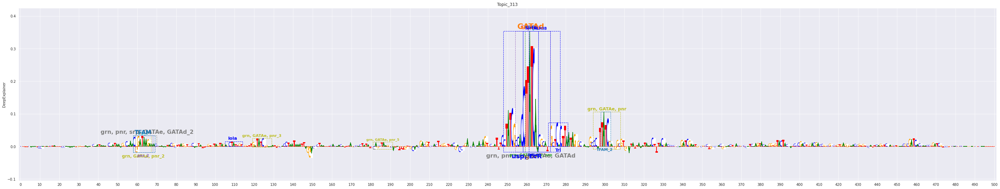

 10%|████▍                                       | 1/10 [00:29<04:25, 29.45s/it]

Sequence: ('chr2R', 14678233, 14678733)

Topic 313
Model 1
0.036804467
srp
grn, GATAe, pnr
Overlap between grn, GATAe, pnr and srp
grn, pnr, srp, GATAe, GATAd
Overlap between grn, pnr, srp, GATAe, GATAd and srp
Overlap between grn, pnr, srp, GATAe, GATAd and grn, GATAe, pnr
GATAe
Overlap between GATAe and srp
Overlap between GATAe and grn, GATAe, pnr
Overlap between GATAe and grn, pnr, srp, GATAe, GATAd
grn
Overlap between grn and srp
Overlap between grn and grn, GATAe, pnr
Overlap between grn and grn, pnr, srp, GATAe, GATAd
Overlap between grn and GATAe
pnr
Overlap between pnr and srp
Overlap between pnr and grn, GATAe, pnr
Overlap between pnr and grn, pnr, srp, GATAe, GATAd
Overlap between pnr and GATAe
Overlap between pnr and grn
ham
Overlap between ham and srp
Overlap between ham and grn, GATAe, pnr
Overlap between ham and grn, pnr, srp, GATAe, GATAd
Overlap between ham and GATAe
Overlap between ham and grn
Overlap between ham and pnr
grn, GATAe, pnr, srp
Overlap between grn, GATAe

<Figure size 3600x1440 with 0 Axes>

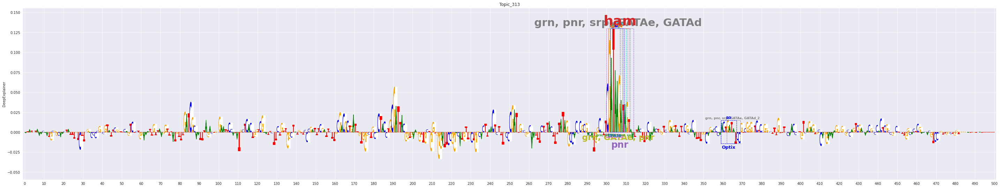

 20%|████████▊                                   | 2/10 [00:58<03:53, 29.15s/it]

Sequence: ('chr3L', 2813723, 2814223)

Topic 313
Model 1
0.013470501
srp
grn, GATAe, pnr
Overlap between grn, GATAe, pnr and srp
grn, pnr, srp, GATAe, GATAd
Overlap between grn, pnr, srp, GATAe, GATAd and srp
Overlap between grn, pnr, srp, GATAe, GATAd and grn, GATAe, pnr
GATAe
Overlap between GATAe and srp
Overlap between GATAe and grn, GATAe, pnr
Overlap between GATAe and grn, pnr, srp, GATAe, GATAd
grn
Overlap between grn and srp
Overlap between grn and grn, GATAe, pnr
Overlap between grn and grn, pnr, srp, GATAe, GATAd
Overlap between grn and GATAe
pnr
Overlap between pnr and srp
Overlap between pnr and grn, GATAe, pnr
Overlap between pnr and grn, pnr, srp, GATAe, GATAd
Overlap between pnr and GATAe
Overlap between pnr and grn
ham
Overlap between ham and srp
Overlap between ham and grn, GATAe, pnr
Overlap between ham and grn, pnr, srp, GATAe, GATAd
Overlap between ham and GATAe
Overlap between ham and grn
Overlap between ham and pnr
grn, GATAe, pnr, srp
Overlap between grn, GATAe, 

<Figure size 3600x1440 with 0 Axes>

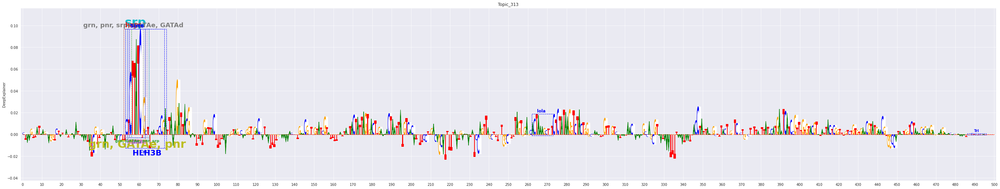

 30%|█████████████▏                              | 3/10 [01:27<03:23, 29.12s/it]

Sequence: ('chr2L', 8351804, 8352304)

Topic 313
Model 1
0.21059906
srp
grn, GATAe, pnr
Overlap between grn, GATAe, pnr and srp
Overlap between grn, GATAe, pnr and srp_2
grn, pnr, srp, GATAe, GATAd
Overlap between grn, pnr, srp, GATAe, GATAd and grn, GATAe, pnr_2
Overlap between grn, pnr, srp, GATAe, GATAd and srp_2
Overlap between grn, pnr, srp, GATAe, GATAd and grn, GATAe, pnr_3
Overlap between grn, pnr, srp, GATAe, GATAd and srp_3
GATAe
Overlap between GATAe and srp
Overlap between GATAe and grn, GATAe, pnr
Overlap between GATAe and grn, GATAe, pnr_2
Overlap between GATAe and grn, pnr, srp, GATAe, GATAd
grn
Overlap between grn and grn, GATAe, pnr_2
Overlap between grn and grn, pnr, srp, GATAe, GATAd
Overlap between grn and GATAe_2
Overlap between grn and srp
Overlap between grn and grn, GATAe, pnr
Overlap between grn and GATAe
pnr
Overlap between pnr and srp
Overlap between pnr and grn, GATAe, pnr
Overlap between pnr and GATAe
Overlap between pnr and grn_2
Overlap between pnr and sr

<Figure size 3600x1440 with 0 Axes>

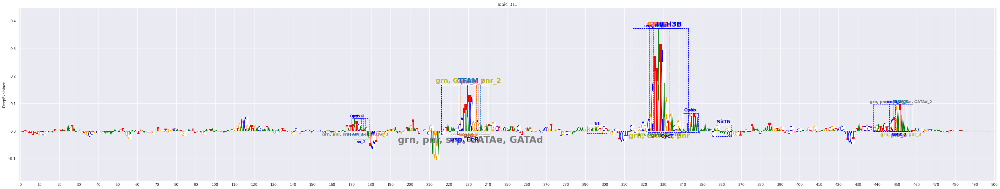

 40%|█████████████████▌                          | 4/10 [01:54<02:50, 28.40s/it]

Sequence: ('chr2L', 9010193, 9010693)

Topic 313
Model 1
0.12708998
srp
grn, GATAe, pnr
Overlap between grn, GATAe, pnr and srp
grn, pnr, srp, GATAe, GATAd
Overlap between grn, pnr, srp, GATAe, GATAd and grn, GATAe, pnr_2
Overlap between grn, pnr, srp, GATAe, GATAd and srp
Overlap between grn, pnr, srp, GATAe, GATAd and grn, GATAe, pnr
Overlap between grn, pnr, srp, GATAe, GATAd and grn, GATAe, pnr_4
Overlap between grn, pnr, srp, GATAe, GATAd and grn, GATAe, pnr_6
GATAe
Overlap between GATAe and srp
Overlap between GATAe and grn, GATAe, pnr
Overlap between GATAe and grn, pnr, srp, GATAe, GATAd_2
grn
Overlap between grn and grn, GATAe, pnr_2
Overlap between grn and grn, pnr, srp, GATAe, GATAd
Overlap between grn and srp
Overlap between grn and grn, GATAe, pnr
Overlap between grn and grn, pnr, srp, GATAe, GATAd_2
Overlap between grn and GATAe_2
pnr
Overlap between pnr and grn, GATAe, pnr_2
Overlap between pnr and grn, pnr, srp, GATAe, GATAd
Overlap between pnr and grn
Overlap between pn

<Figure size 3600x1440 with 0 Axes>

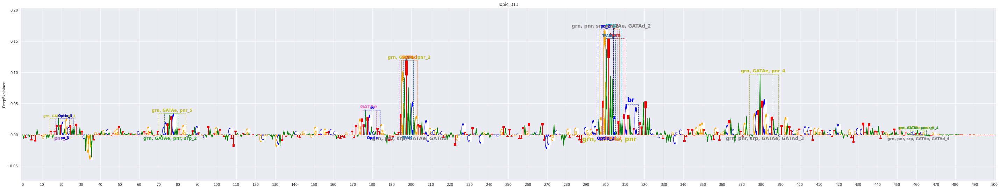

 50%|██████████████████████                      | 5/10 [02:23<02:23, 28.62s/it]

Sequence: ('chr2L', 14014922, 14015422)

Topic 313
Model 1
0.4045682
srp
grn, GATAe, pnr
grn, pnr, srp, GATAe, GATAd
Overlap between grn, pnr, srp, GATAe, GATAd and srp
GATAe
Overlap between GATAe and srp
Overlap between GATAe and grn, pnr, srp, GATAe, GATAd
grn
Overlap between grn and srp
Overlap between grn and grn, pnr, srp, GATAe, GATAd
Overlap between grn and GATAe
pnr
Overlap between pnr and srp
Overlap between pnr and grn, pnr, srp, GATAe, GATAd
Overlap between pnr and GATAe
Overlap between pnr and grn
ham
Overlap between ham and grn, GATAe, pnr
Overlap between ham and srp
Overlap between ham and grn, pnr, srp, GATAe, GATAd
Overlap between ham and GATAe
Overlap between ham and grn
Overlap between ham and pnr
grn, GATAe, pnr, srp
Overlap between grn, GATAe, pnr, srp and srp
Overlap between grn, GATAe, pnr, srp and grn, pnr, srp, GATAe, GATAd
Overlap between grn, GATAe, pnr, srp and GATAe
Overlap between grn, GATAe, pnr, srp and grn
Overlap between grn, GATAe, pnr, srp and pnr
Ove

<Figure size 3600x1440 with 0 Axes>

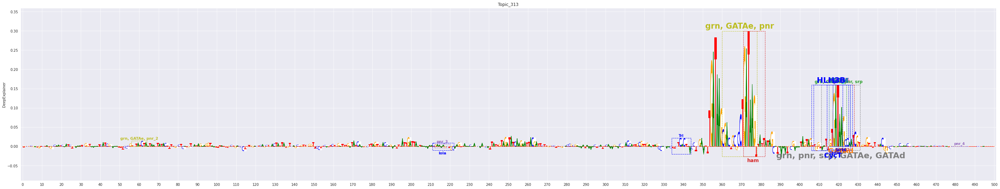

 60%|██████████████████████████▍                 | 6/10 [02:53<01:55, 28.96s/it]

Sequence: ('chr2L', 6819052, 6819552)

Topic 313
Model 1
0.017573446
srp
grn, GATAe, pnr
Overlap between grn, GATAe, pnr and srp
grn, pnr, srp, GATAe, GATAd
Overlap between grn, pnr, srp, GATAe, GATAd and srp
Overlap between grn, pnr, srp, GATAe, GATAd and grn, GATAe, pnr
GATAe
Overlap between GATAe and srp
Overlap between GATAe and grn, GATAe, pnr
Overlap between GATAe and grn, pnr, srp, GATAe, GATAd
grn
Overlap between grn and srp
Overlap between grn and grn, GATAe, pnr
Overlap between grn and grn, pnr, srp, GATAe, GATAd
Overlap between grn and GATAe
pnr
Overlap between pnr and srp
Overlap between pnr and grn, GATAe, pnr
Overlap between pnr and grn, pnr, srp, GATAe, GATAd
Overlap between pnr and GATAe
Overlap between pnr and grn
ham
Overlap between ham and srp
Overlap between ham and grn, GATAe, pnr
Overlap between ham and grn, pnr, srp, GATAe, GATAd
Overlap between ham and GATAe
Overlap between ham and grn
Overlap between ham and pnr
grn, GATAe, pnr, srp
Overlap between grn, GATAe, 

<Figure size 3600x1440 with 0 Axes>

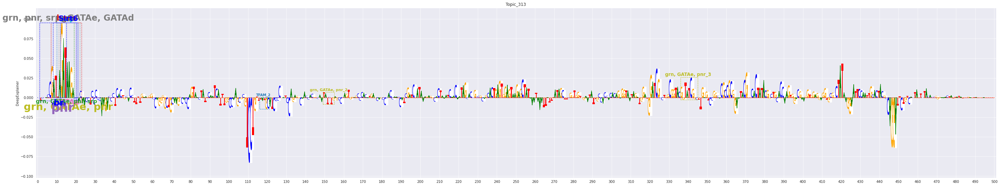

 70%|██████████████████████████████▊             | 7/10 [03:22<01:26, 28.98s/it]

Sequence: ('chr2R', 17337990, 17338490)

Topic 313
Model 1
0.04286927
srp
grn, GATAe, pnr
Overlap between grn, GATAe, pnr and srp_2
Overlap between grn, GATAe, pnr and srp
grn, pnr, srp, GATAe, GATAd
Overlap between grn, pnr, srp, GATAe, GATAd and srp
Overlap between grn, pnr, srp, GATAe, GATAd and grn, GATAe, pnr_2
Overlap between grn, pnr, srp, GATAe, GATAd and srp_2
Overlap between grn, pnr, srp, GATAe, GATAd and grn, GATAe, pnr
GATAe
Overlap between GATAe and srp_2
Overlap between GATAe and grn, GATAe, pnr
Overlap between GATAe and grn, pnr, srp, GATAe, GATAd_2
Overlap between GATAe and srp
Overlap between GATAe and grn, GATAe, pnr_2
Overlap between GATAe and grn, pnr, srp, GATAe, GATAd
grn
Overlap between grn and srp_2
Overlap between grn and grn, GATAe, pnr
Overlap between grn and grn, pnr, srp, GATAe, GATAd_2
Overlap between grn and GATAe
Overlap between grn and srp
Overlap between grn and grn, GATAe, pnr_2
Overlap between grn and grn, pnr, srp, GATAe, GATAd
Overlap between grn 

<Figure size 3600x1440 with 0 Axes>

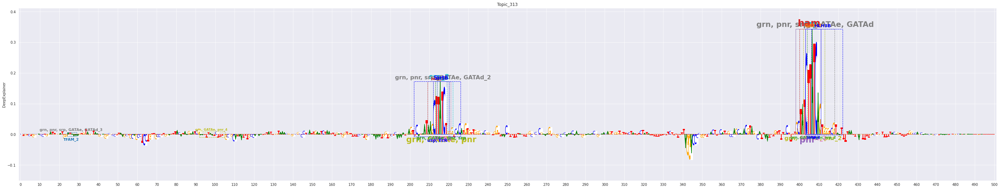

 80%|███████████████████████████████████▏        | 8/10 [03:48<00:56, 28.10s/it]

Sequence: ('chr2L', 1903883, 1904383)

Topic 313
Model 1
0.086972654
srp
grn, GATAe, pnr
Overlap between grn, GATAe, pnr and srp
grn, pnr, srp, GATAe, GATAd
Overlap between grn, pnr, srp, GATAe, GATAd and srp
Overlap between grn, pnr, srp, GATAe, GATAd and grn, GATAe, pnr
Overlap between grn, pnr, srp, GATAe, GATAd and grn, GATAe, pnr_2
GATAe
Overlap between GATAe and srp
Overlap between GATAe and grn, GATAe, pnr
Overlap between GATAe and grn, pnr, srp, GATAe, GATAd
Overlap between GATAe and grn, GATAe, pnr_2
Overlap between GATAe and grn, pnr, srp, GATAe, GATAd_2
grn
Overlap between grn and srp
Overlap between grn and grn, GATAe, pnr
Overlap between grn and grn, pnr, srp, GATAe, GATAd
Overlap between grn and GATAe
Overlap between grn and grn, GATAe, pnr_2
Overlap between grn and grn, pnr, srp, GATAe, GATAd_2
Overlap between grn and GATAe_2
pnr
Overlap between pnr and grn, GATAe, pnr_2
Overlap between pnr and grn, pnr, srp, GATAe, GATAd_2
Overlap between pnr and GATAe_2
Overlap between

<Figure size 3600x1440 with 0 Axes>

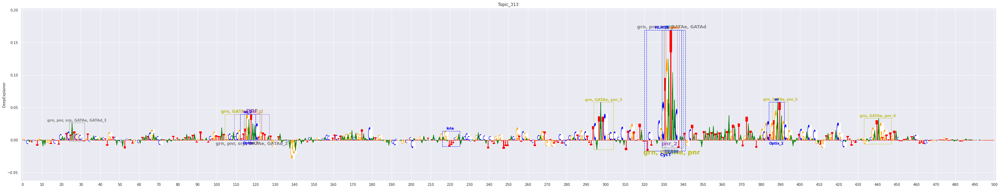

 90%|███████████████████████████████████████▌    | 9/10 [04:16<00:28, 28.55s/it]


IndexError: list index out of range

In [39]:
# Plot deepexplainers from a given BED file
import pybedtools
from pybedtools import BedTool
from tqdm import tqdm 
genomefile_path = "/staging/leuven/stg_00002/lcb/itask/files/genomes/dm6/dmel-all-chromosome-r6.03.fasta"

topics = [313]

n_plots = 10

# Select BED file
filename = "/data/leuven/338/vsc33893/jupyterhub_notebooks/thesis/dl/epithelium_regions.bed"
with open(filename) as inp:
        lines = inp.readlines()
        lines = [line.strip().split() for line in lines]

# You can select multiple topics to be checked for a given sequence
for i in tqdm(range(0,n_plots)):
    z = 2
    location = ("chr"+lines[i+z][0],int(lines[i+z][1]),int(lines[i+z][2])) 
    print("Sequence: " + str(location))
    seq_onehot = utils.one_hot_encode_along_row_axis(BedTool.seq(location, genomefile_path))
    
    ntrack = (len(models))*2
    fig = plt.figure(figsize=(50,ntrack*10))
    for topic in topics:
        print('\nTopic '+str(topic))
        fig = plt.figure(figsize=(50,ntrack*10))
        for j in range(0,len(models)):
            print('Model ' + str(j+1))
            # We print the prediction score the model gives the selected sequence for the given topic
            arr = models[j].predict(seq_onehot)[0]
            print(arr[topic-1])
            track_no=(2*(j+0)+1)
            positions = match_motifs_cbust(location, filtered_motif_dict, genomefile_path, threshold=0)
            ax1 = plot_deepexplainer_givenax(explainer=exp_dict[str(j)], fig=fig, ntrack=ntrack, track_no=track_no, seq_onehot=seq_onehot, topic = topic, motif_positions=positions)


            # Plot in silico mutagenesis for the selected topic
            #track_no=2*(j+0)+2
            #_ = utils.plot_mutagenesis_givenax(model=model_dict[str(j)], fig=fig, ntrack=ntrack, track_no=track_no, seq_onehot=seq_onehot, topic = topic)
            
    plt.show()
    #plt.savefig("fca/enhX.png")

#fig = plt.figure(figsize=(50,10))
#utils.plot_prediction_givenax(model = model_dict[str(0)], fig=fig, ntrack=ntrack, track_no=track_no, seq_onehot=seq_onehot)

  0%|                                                    | 0/10 [00:00<?, ?it/s]

Sequence: ('chr2L', 7412902, 7413402)

Topic 253
Model 1
0.028884381
Mef2
Trl
NfI
rump, Mef2
danr
Optix
Tbp
DNApol-iota
Adf1
lola
Kdm2
Nf1
jumu, CHES-1-like
Mad
Hsf
C15
Cf2
E2f1
Overlap between E2f1 and Trl
nos
tth, d4
gem
Odc2, Odc1
CrebB
CG1924, Cnx14D, Cnx99A
HDAC1
jim
CG7372, CG6654
Tet
Trf, Trf2, Tbp
trx
BtbVII
nau
Cfp1, CG17440, CG3347
EcR
Deaf1
Hey
gt, CG7786, Pdp1
foxo
z
His2B:CG33906, His2B:CG33890, His2B:CG33884, His2B:CG17949, His2B:CG33886, His2B:CG33876, His2B:CG33882, His2B:CG33870, His2B:CG33900, His2B:CG33868, His2B:CG33908, His2B:CG33874, His2B:CG33910, His2B:CG33880, His2B:CG33878, His2B:CG33898, His2B:CG33896, His2B:CG33902, His2B:CG33894, His2B:CG33892, His2B:CG33888, His2B:CG33872, His2B:CG33904
crp
Taf1
{'Mef2': [453, 16, 0, 7.4, 'tab:cyan'], 'Mef2_2': [193, 10, 0, 7.27, 'tab:cyan'], 'Mef2_3': [234, 8, 0, 6.57, 'tab:cyan'], 'Trl': [122, 11, 0, 8.79, 'tab:olive'], 'Adf1': [242, 15, 0, 6.83, 'tab:orange'], 'E2f1': [122, 15, 1, 8.09, 'b'], 'nau': [97, 15, 0, 6.67, 'b

<Figure size 3600x1440 with 0 Axes>

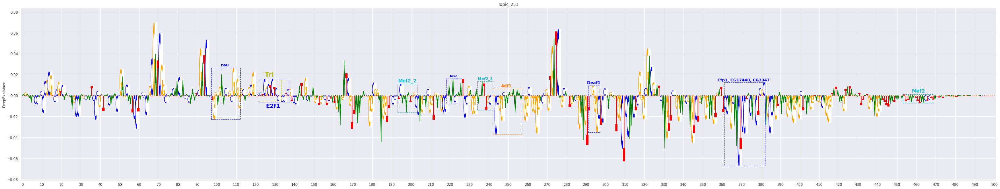

 10%|████▍                                       | 1/10 [00:39<05:56, 39.66s/it]

Sequence: ('chr2L', 15112437, 15112937)

Topic 253
Model 1
0.00068569183
Mef2
Trl
NfI
rump, Mef2
danr
Optix
Tbp
DNApol-iota
Adf1
lola
Kdm2
Nf1
Overlap between Nf1 and NfI
jumu, CHES-1-like
Mad
Hsf
C15
Cf2
E2f1
nos
tth, d4
gem
Odc2, Odc1
CrebB
CG1924, Cnx14D, Cnx99A
HDAC1
jim
CG7372, CG6654
Tet
Trf, Trf2, Tbp
trx
BtbVII
nau
Overlap between nau and NfI
Overlap between nau and Nf1
Cfp1, CG17440, CG3347
EcR
Deaf1
Hey
gt, CG7786, Pdp1
foxo
Overlap between foxo and jim
z
His2B:CG33906, His2B:CG33890, His2B:CG33884, His2B:CG17949, His2B:CG33886, His2B:CG33876, His2B:CG33882, His2B:CG33870, His2B:CG33900, His2B:CG33868, His2B:CG33908, His2B:CG33874, His2B:CG33910, His2B:CG33880, His2B:CG33878, His2B:CG33898, His2B:CG33896, His2B:CG33902, His2B:CG33894, His2B:CG33892, His2B:CG33888, His2B:CG33872, His2B:CG33904
crp
Taf1
{'NfI': [413, 15, 0, 7.18, 'tab:gray'], 'Nf1': [412, 16, 1, 7.73, 'b'], 'Mad': [435, 14, 0, 6.83, 'b'], 'tth, d4': [153, 11, 0, 6.21, 'b'], 'CrebB': [297, 14, 0, 6.71, 'b'], 'ji

<Figure size 3600x1440 with 0 Axes>

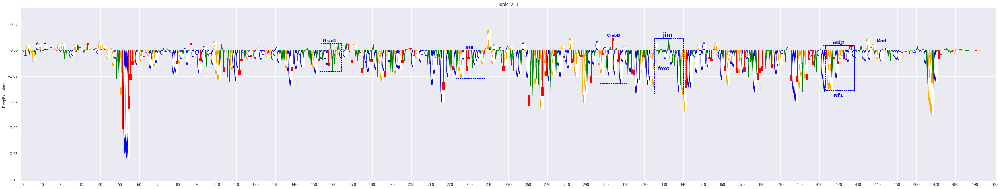

 20%|████████▊                                   | 2/10 [01:19<05:16, 39.57s/it]

Sequence: ('chr2L', 15254917, 15255417)

Topic 253
Model 1
0.0010391474
Mef2
Trl
NfI
rump, Mef2
danr
Optix
Tbp
DNApol-iota
Adf1
lola
Kdm2
Nf1
jumu, CHES-1-like
Mad
Overlap between Mad and lola
Hsf
C15
Cf2
E2f1
nos
tth, d4
gem
Odc2, Odc1
CrebB
CG1924, Cnx14D, Cnx99A
HDAC1
jim
Overlap between jim and Mef2
CG7372, CG6654
Tet
Trf, Trf2, Tbp
trx
BtbVII
nau
Cfp1, CG17440, CG3347
EcR
Deaf1
Overlap between Deaf1 and CrebB
Hey
gt, CG7786, Pdp1
foxo
z
His2B:CG33906, His2B:CG33890, His2B:CG33884, His2B:CG17949, His2B:CG33886, His2B:CG33876, His2B:CG33882, His2B:CG33870, His2B:CG33900, His2B:CG33868, His2B:CG33908, His2B:CG33874, His2B:CG33910, His2B:CG33880, His2B:CG33878, His2B:CG33898, His2B:CG33896, His2B:CG33902, His2B:CG33894, His2B:CG33892, His2B:CG33888, His2B:CG33872, His2B:CG33904
crp
Taf1
{'Mef2': [63, 8, 0, 6.43, 'tab:cyan'], 'lola': [110, 11, 0, 6.87, 'tab:blue'], 'Mad_2': [109, 14, 1, 6.64, 'b'], 'gem': [236, 7, 0, 6.78, 'b'], 'CrebB': [217, 8, 0, 8.58, 'b'], 'jim': [60, 15, 1, 7.13,

<Figure size 3600x1440 with 0 Axes>

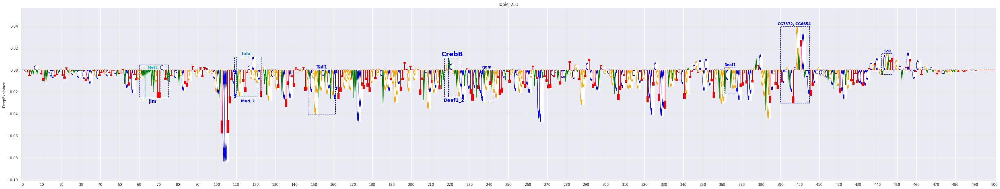

 30%|█████████████▏                              | 3/10 [01:57<04:34, 39.18s/it]

Sequence: ('chr2L', 15497991, 15498491)

Topic 253
Model 1
0.010301888
Mef2
Trl
NfI
rump, Mef2
Overlap between rump, Mef2 and Mef2
danr
Optix
Tbp
DNApol-iota
Adf1
lola
Kdm2
Nf1
jumu, CHES-1-like
Mad
Overlap between Mad and Adf1
Hsf
C15
Cf2
E2f1
nos
tth, d4
gem
Odc2, Odc1
Overlap between Odc2, Odc1 and nos_2
CrebB
CG1924, Cnx14D, Cnx99A
HDAC1
jim
CG7372, CG6654
Tet
Trf, Trf2, Tbp
trx
BtbVII
nau
Cfp1, CG17440, CG3347
EcR
Deaf1
Hey
gt, CG7786, Pdp1
foxo
z
Overlap between z and lola
His2B:CG33906, His2B:CG33890, His2B:CG33884, His2B:CG17949, His2B:CG33886, His2B:CG33876, His2B:CG33882, His2B:CG33870, His2B:CG33900, His2B:CG33868, His2B:CG33908, His2B:CG33874, His2B:CG33910, His2B:CG33880, His2B:CG33878, His2B:CG33898, His2B:CG33896, His2B:CG33902, His2B:CG33894, His2B:CG33892, His2B:CG33888, His2B:CG33872, His2B:CG33904
crp
Overlap between crp and Mad
Taf1
{'Mef2': [414, 12, 0, 8.14, 'tab:cyan'], 'NfI': [477, 6, 0, 6.2, 'tab:gray'], 'rump, Mef2': [414, 13, 1, 6.22, 'tab:pink'], 'Adf1': [7,

<Figure size 3600x1440 with 0 Axes>

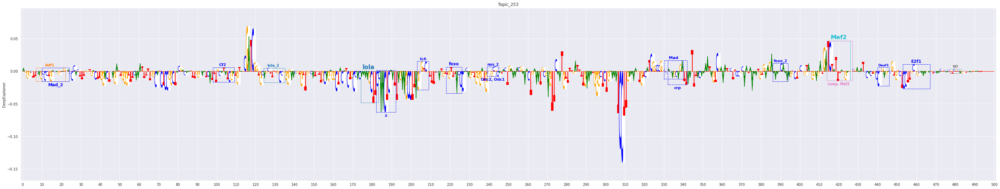

 40%|█████████████████▌                          | 4/10 [02:38<03:58, 39.78s/it]

Sequence: ('chr2L', 7783529, 7784029)

Topic 253
Model 1
0.023718089
Mef2
Trl
NfI
rump, Mef2
danr
Optix
Tbp
DNApol-iota
Adf1
lola
Kdm2
Nf1
jumu, CHES-1-like
Mad
Hsf
C15
Cf2
E2f1
Overlap between E2f1 and Mad
nos
tth, d4
gem
Odc2, Odc1
CrebB
Overlap between CrebB and Mad_2
CG1924, Cnx14D, Cnx99A
HDAC1
jim
CG7372, CG6654
Tet
Trf, Trf2, Tbp
trx
BtbVII
nau
Cfp1, CG17440, CG3347
EcR
Deaf1
Hey
gt, CG7786, Pdp1
foxo
z
His2B:CG33906, His2B:CG33890, His2B:CG33884, His2B:CG17949, His2B:CG33886, His2B:CG33876, His2B:CG33882, His2B:CG33870, His2B:CG33900, His2B:CG33868, His2B:CG33908, His2B:CG33874, His2B:CG33910, His2B:CG33880, His2B:CG33878, His2B:CG33898, His2B:CG33896, His2B:CG33902, His2B:CG33894, His2B:CG33892, His2B:CG33888, His2B:CG33872, His2B:CG33904
crp
Taf1
Overlap between Taf1 and Mad
Overlap between Taf1 and E2f1
{'Mef2': [214, 7, 0, 7.06, 'tab:cyan'], 'Mef2_2': [445, 14, 0, 6.06, 'tab:cyan'], 'NfI': [309, 17, 0, 6.49, 'tab:gray'], 'Tbp': [349, 15, 0, 7.34, 'tab:red'], 'lola': [173, 1

<Figure size 3600x1440 with 0 Axes>

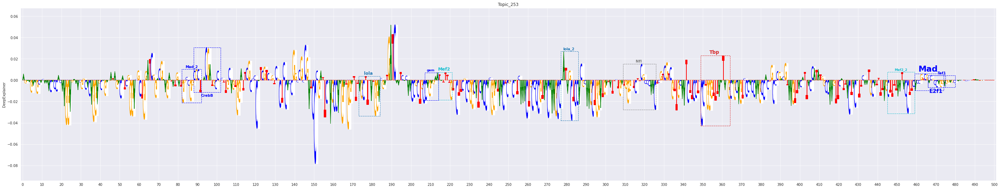

 50%|██████████████████████                      | 5/10 [03:17<03:17, 39.47s/it]

Sequence: ('chr2L', 3468871, 3469371)

Topic 253
Model 1
0.0003733039
Mef2
Trl
NfI
rump, Mef2
danr
Optix
Tbp
DNApol-iota
Adf1
lola
Kdm2
Nf1
jumu, CHES-1-like
Mad
Hsf
C15
Overlap between C15 and NfI
Cf2
Overlap between Cf2 and jumu, CHES-1-like
E2f1
Overlap between E2f1 and Mad
nos
tth, d4
Overlap between tth, d4 and jumu, CHES-1-like
Overlap between tth, d4 and Cf2
gem
Odc2, Odc1
CrebB
Overlap between CrebB and Mad_2
CG1924, Cnx14D, Cnx99A
HDAC1
jim
CG7372, CG6654
Overlap between CG7372, CG6654 and Mad
Overlap between CG7372, CG6654 and E2f1
Tet
Trf, Trf2, Tbp
trx
BtbVII
nau
Overlap between nau and Nf1
Cfp1, CG17440, CG3347
EcR
Deaf1
Hey
gt, CG7786, Pdp1
foxo
z
His2B:CG33906, His2B:CG33890, His2B:CG33884, His2B:CG17949, His2B:CG33886, His2B:CG33876, His2B:CG33882, His2B:CG33870, His2B:CG33900, His2B:CG33868, His2B:CG33908, His2B:CG33874, His2B:CG33910, His2B:CG33880, His2B:CG33878, His2B:CG33898, His2B:CG33896, His2B:CG33902, His2B:CG33894, His2B:CG33892, His2B:CG33888, His2B:CG33872, 

<Figure size 3600x1440 with 0 Axes>

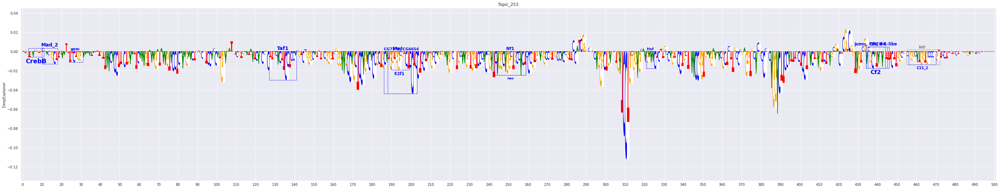

 60%|██████████████████████████▍                 | 6/10 [03:56<02:37, 39.31s/it]

Sequence: ('chr2L', 3355698, 3356198)

Topic 253
Model 1
0.008946657
Mef2
Trl
NfI
rump, Mef2
danr
Optix
Tbp
Overlap between Tbp and Mef2
DNApol-iota
Adf1
lola
Overlap between lola and Mef2
Overlap between lola and Tbp
Kdm2
Nf1
jumu, CHES-1-like
Mad
Hsf
C15
Cf2
E2f1
nos
Overlap between nos and Cf2
tth, d4
gem
Odc2, Odc1
Overlap between Odc2, Odc1 and nos
CrebB
CG1924, Cnx14D, Cnx99A
HDAC1
jim
CG7372, CG6654
Tet
Trf, Trf2, Tbp
trx
BtbVII
nau
Cfp1, CG17440, CG3347
EcR
Deaf1
Hey
gt, CG7786, Pdp1
foxo
z
His2B:CG33906, His2B:CG33890, His2B:CG33884, His2B:CG17949, His2B:CG33886, His2B:CG33876, His2B:CG33882, His2B:CG33870, His2B:CG33900, His2B:CG33868, His2B:CG33908, His2B:CG33874, His2B:CG33910, His2B:CG33880, His2B:CG33878, His2B:CG33898, His2B:CG33896, His2B:CG33902, His2B:CG33894, His2B:CG33892, His2B:CG33888, His2B:CG33872, His2B:CG33904
Overlap between His2B:CG33906, His2B:CG33890, His2B:CG33884, His2B:CG17949, His2B:CG33886, His2B:CG33876, His2B:CG33882, His2B:CG33870, His2B:CG33900, H

<Figure size 3600x1440 with 0 Axes>

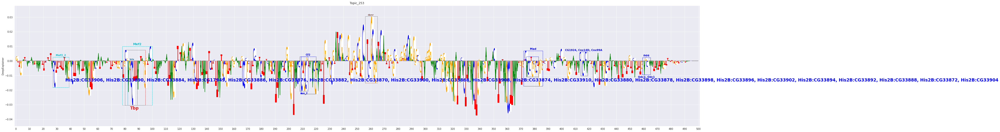

 70%|██████████████████████████████▊             | 7/10 [04:37<01:59, 39.84s/it]

Sequence: ('chr2L', 3873270, 3873770)

Topic 253
Model 1
0.00092062354
Mef2
Trl
NfI
rump, Mef2
danr
Optix
Tbp
DNApol-iota
Adf1
lola
Kdm2
Nf1
jumu, CHES-1-like
Mad
Hsf
C15
Cf2
Overlap between Cf2 and Tbp
E2f1
nos
tth, d4
gem
Odc2, Odc1
CrebB
CG1924, Cnx14D, Cnx99A
HDAC1
jim
CG7372, CG6654
Tet
Trf, Trf2, Tbp
trx
BtbVII
nau
Cfp1, CG17440, CG3347
EcR
Deaf1
Hey
gt, CG7786, Pdp1
foxo
z
His2B:CG33906, His2B:CG33890, His2B:CG33884, His2B:CG17949, His2B:CG33886, His2B:CG33876, His2B:CG33882, His2B:CG33870, His2B:CG33900, His2B:CG33868, His2B:CG33908, His2B:CG33874, His2B:CG33910, His2B:CG33880, His2B:CG33878, His2B:CG33898, His2B:CG33896, His2B:CG33902, His2B:CG33894, His2B:CG33892, His2B:CG33888, His2B:CG33872, His2B:CG33904
crp
Taf1
Overlap between Taf1 and Trl_3
{'Trl': [177, 10, 0, 7.76, 'tab:olive'], 'Trl_2': [427, 10, 0, 6.05, 'tab:olive'], 'Trl_3': [38, 10, 0, 6.14, 'tab:olive'], 'Tbp': [372, 15, 0, 6.51, 'tab:red'], 'Adf1': [356, 15, 0, 6.6, 'tab:orange'], 'lola': [470, 11, 0, 6.03, 'ta

<Figure size 3600x1440 with 0 Axes>

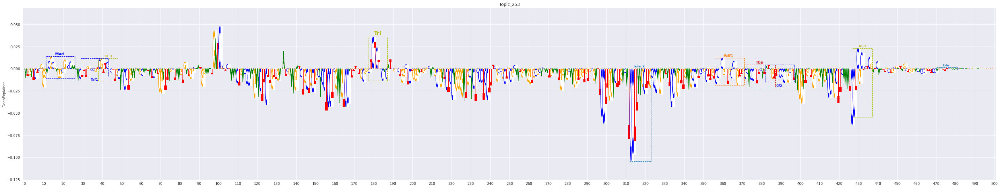

 80%|███████████████████████████████████▏        | 8/10 [05:16<01:19, 39.60s/it]

Sequence: ('chr2R', 10646291, 10646791)

Topic 253
Model 1
0.0041767657
Mef2
Trl
NfI
rump, Mef2
danr
Optix
Tbp
DNApol-iota
Adf1
lola
Overlap between lola and NfI_2
Kdm2
Nf1
jumu, CHES-1-like
Overlap between jumu, CHES-1-like and NfI_2
Mad
Hsf
C15
Cf2
E2f1
nos
Overlap between nos and Mad
tth, d4
Overlap between tth, d4 and Cf2
gem
Overlap between gem and Mad
Odc2, Odc1
Overlap between Odc2, Odc1 and Mad
Overlap between Odc2, Odc1 and nos
CrebB
CG1924, Cnx14D, Cnx99A
HDAC1
jim
Overlap between jim and NfI_2
Overlap between jim and lola
Overlap between jim and jumu, CHES-1-like
CG7372, CG6654
Overlap between CG7372, CG6654 and NfI_2
Overlap between CG7372, CG6654 and lola
Overlap between CG7372, CG6654 and jumu, CHES-1-like
Overlap between CG7372, CG6654 and jim
Tet
Trf, Trf2, Tbp
trx
BtbVII
nau
Overlap between nau and NfI
Cfp1, CG17440, CG3347
EcR
Deaf1
Hey
gt, CG7786, Pdp1
foxo
z
His2B:CG33906, His2B:CG33890, His2B:CG33884, His2B:CG17949, His2B:CG33886, His2B:CG33876, His2B:CG33882, His2

<Figure size 3600x1440 with 0 Axes>

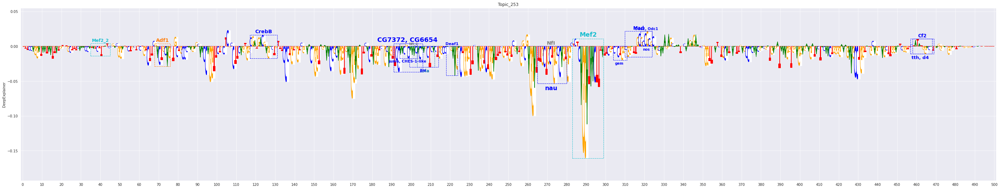

 90%|███████████████████████████████████████▌    | 9/10 [05:57<00:39, 39.76s/it]


IndexError: list index out of range

In [40]:
# Plot deepexplainers from a given BED file
import pybedtools
from pybedtools import BedTool
from tqdm import tqdm 


import pickle
infile = open('/staging/leuven/stg_00002/lcb/ijanic/projects/FCA_atac/dl/motif_dict_252_all_annot.pkl', 'rb')
motif_dict = pickle.load(infile)
filtered_motif_dict = motif_dict
infile.close()

genomefile_path = "/staging/leuven/stg_00002/lcb/itask/files/genomes/dm6/dmel-all-chromosome-r6.03.fasta"

topics = [253]

n_plots = 10

# Select BED file
filename = "/data/leuven/338/vsc33893/jupyterhub_notebooks/thesis/dl/muscle_regions.bed"
with open(filename) as inp:
        lines = inp.readlines()
        lines = [line.strip().split() for line in lines]

# You can select multiple topics to be checked for a given sequence
for i in tqdm(range(0,n_plots)):
    z = 2
    location = ("chr"+lines[i+z][0],int(lines[i+z][1]),int(lines[i+z][2])) 
    print("Sequence: " + str(location))
    seq_onehot = utils.one_hot_encode_along_row_axis(BedTool.seq(location, genomefile_path))
    
    ntrack = (len(models))*2
    fig = plt.figure(figsize=(50,ntrack*10))
    for topic in topics:
        print('\nTopic '+str(topic))
        fig = plt.figure(figsize=(50,ntrack*10))
        for j in range(0,len(models)):
            print('Model ' + str(j+1))
            # We print the prediction score the model gives the selected sequence for the given topic
            arr = models[j].predict(seq_onehot)[0]
            print(arr[topic-1])
            track_no=(2*(j+0)+1)
            positions = match_motifs_cbust(location, filtered_motif_dict, genomefile_path, threshold=0)
            ax1 = plot_deepexplainer_givenax(explainer=exp_dict[str(j)], fig=fig, ntrack=ntrack, track_no=track_no, seq_onehot=seq_onehot, topic = topic, motif_positions=positions)


            # Plot in silico mutagenesis for the selected topic
            #track_no=2*(j+0)+2
            #_ = utils.plot_mutagenesis_givenax(model=model_dict[str(j)], fig=fig, ntrack=ntrack, track_no=track_no, seq_onehot=seq_onehot, topic = topic)
            
    plt.show()
    #plt.savefig("fca/enhX.png")

#fig = plt.figure(figsize=(50,10))
#utils.plot_prediction_givenax(model = model_dict[str(0)], fig=fig, ntrack=ntrack, track_no=track_no, seq_onehot=seq_onehot)